# Actor-Critic

이번 노트북에서는 Actor-Critic알고리즘을 CartPole환경에서 구현해보도록 하겠습니다.

구현에 필요한 라이브러리들을 import합니다.

In [ ]:
import gym
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Categorical

plot을 찍기 위해 matplotlib 라이브러리를 import 합니다.

In [ ]:
from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

## Actor Netowrk

Policy에 사용될 Actor network입니다. state를 input으로 받고, output으로 각 action에 대한 확률값을 반환합니다.

In [ ]:
class Actor(nn.Module):
    def __init__(self, obs_dim, n_actions):
        super(Actor, self).__init__()
        self.l1 = nn.Linear(obs_dim, 64)
        self.l2 = nn.Linear(64, 128)
        self.l3 = nn.Linear(128, n_actions)

    def forward(self, x):
        x = F.relu(self.l1(x))
        x = F.relu(self.l2(x))
        x = F.softmax(self.l3(x))
        return x

## Critic Network

Policy에 사용될 Critic network입니다. state를 input으로 받고, output으로 현재 state에 대한 value값을 반환합니다.

In [ ]:
class Critic(nn.Module):
    def __init__(self, obs_dim):
        super(Critic, self).__init__()
        self.l1 = nn.Linear(obs_dim, 64)
        self.l2 = nn.Linear(64, 128)
        self.l3 = nn.Linear(128, 1)

    def forward(self, x):
        x = F.relu(self.l1(x))
        x = F.relu(self.l2(x))
        x = self.l3(x)
        return x

# Policy

Policy로 사용될 뉴럴넷 모델입니다. 위에서 정의한 Actor network, Critic network를 사용해서, action에 대한 확률값과, value값을 output으로 내어줍니다.

In [ ]:
class CartpolePolicy(nn.Module):
    def __init__(self, obs_dim, n_actions, device):
        super(CartpolePolicy, self).__init__()

        self.obs_dim = obs_dim
        self.n_actions = n_actions
        self.device = device

        self.actor = Actor(obs_dim, n_actions)
        self.critic = Critic(obs_dim)


    def forward(self, x):
        probs = self.actor(x)
        value = self.critic(x)

        return probs, value

    def get_action_logprob_value(self, obs):
        if isinstance(obs, np.ndarray):
            obs = torch.tensor(obs, dtype=torch.float32)
        obs = obs.to(self.device)
        probs, value = self.forward(obs)
        categorical = Categorical(probs)
        action = categorical.sample()
        logprob = categorical.log_prob(action)

        return action.item(), logprob, value


# Train

에피소드가 종료되고난 후 업데이트 하는 함수입니다. 에피소드를 진행하면서 선택했던 action에 대한 log probability, 그 action에 대한 return 그리고 value를 통해 업데이트를 진행하게 됩니다.

optim.zero_grad()를 통해 optimizer에 등록해두었던 parameter들의 gradient를 0으로 세팅해준 후 .backward()를 해주게 되면 gradient가 계산이 되어 parameter들에 gradient가 저장이 됩니다. 

actor loss는 -logprob에 Q값과 value의 차이를 곱해준 형태이며, value loss는 return과 value의 l1 loss입니다.



In [ ]:
def train(logprobs, returns, value, optim):
    optim.zero_grad()
    loss = 0
    # Cumulate gradients
    for ret, logprob, val in zip(returns, logprobs, values):
        adv = ret  - val.item()
        act_loss = -1 * logprob * adv
        val_loss = F.smooth_l1_loss(val, ret)

        loss += (act_loss + val_loss)

    loss.backward()
    optim.step()

# Matplotlib

Matplotlib 라이브러리를 이용해 reward 그래프를 화면에 보여주는 함수입니다.

In [ ]:
def plot(rewards):
    clear_output(True)
    plt.figure(figsize=(20,5))
    # plt.title('')
    plt.ylabel('reward')
    plt.xlabel('episode')
    plt.plot(rewards)
    plt.show()

# Main

트레이닝에 필요한 환경, 모델, optimizer 등등을 정의하는 코드입니다.

In [ ]:
# Save device (cpu or cuda)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Make env
env = gym.make("CartPole-v0")

# shape
obs_shape = env.observation_space.shape
act_shape = tuple([1]) # int to Tuple
obs_dim = obs_shape[0]
n_actions = env.action_space.n
buffer_size = 1000

# Define NN
policy_model = CartpolePolicy(obs_dim=obs_dim, n_actions=n_actions, device=device)
policy_model.to(device)

# Optimizer
optimizer = optim.Adam(policy_model.parameters())

# training parameters
total_step = 60000
batch_size = 32
gamma = 0.99

# list for saving results
rewards = []

# list for saving return & logprobs
logprobs = []
returns = []
values = []

트레이닝을 실행하는 메인루프입니다. total_step만큼 돌면서 매 에피소드마다 선택한 action에 대한 log probability, 리워드 그리고 value를 저장합니다. 에피소드가 끝나면 이전 모델들 보다 좋거나 같은 성능을 내면 모델을 저장합니다. 또한 에피소드가 끝나면 저장했던 리워드를 저장했던 list를 거꾸로 돌면서 return(G_t)로 바꾸어 줍니다. 마지막으로 이전에 정의해주었던 train()함수를 호출하여 트레이닝을 진행합니다.

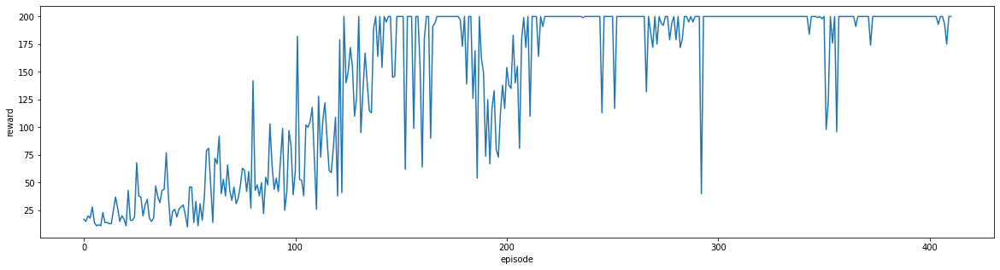

In [ ]:
episode_reward = 0
best_test_reward = -999999
obs = env.reset()

for t in range(total_step):
    action, logprob, value = policy_model.get_action_logprob_value(obs)
    next_obs, rew, done, _ = env.step(action)
    logprobs.append(logprob)
    returns.append(rew)
    values.append(value)
    episode_reward += rew
    obs = next_obs
    

    if done:
        # Save the best model so far
        if best_test_reward <= episode_reward:
            best_test_reward = episode_reward
            torch.save(policy_model.state_dict(), "policy_model.pt")

        # complete returns
        for i in range(len(returns)-2, -1, -1):
            returns[i] += returns[i+1]*gamma
        returns = torch.tensor(returns).to(device)
        rewards.append(episode_reward)
        train(logprobs, returns, values, optimizer)

        logprobs = []
        returns = []
        values = []
        obs = env.reset()
        episode_reward = 0

    
    if t % 1000 == 0:
        plot(rewards)


# Render

In [ ]:
!apt update
!apt install xvfb
!pip install pyvirtualdisplay
!pip install gym-notebook-wrapper

우선 random하게 action을 선택할 경우의 모습입니다. 중심을 유지하지 못하고 금방 떨어지려고 하는 모습을 확인할 수 있습니다.

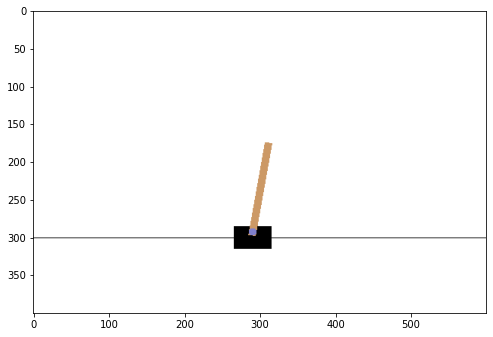

In [ ]:
import gnwrapper
import gym

env = gnwrapper.LoopAnimation(gym.make('CartPole-v0'))

obs = env.reset()
for _ in range(500):
    obs, rew, done, _ = env.step(env.action_space.sample()) # Take random action
    env.render()
    if done:
        obs = env.reset()

env.display()

학습된 policy를 이용해 action을 선택한 경우의 모습입니다. 중심을 잘 잡으려고 하는 모습을 확인할 수 있습니다.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  # This is added back by InteractiveShellApp.init_path()


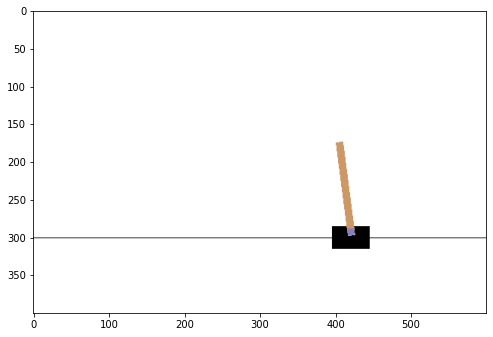

In [ ]:
policy_model.load_state_dict(torch.load("policy_model.pt"))

env = gnwrapper.LoopAnimation(gym.make('CartPole-v0')) # Start Xvfb

obs = env.reset()

for _ in range(500):
    action, _ = policy_model.get_action_logprob(obs)  # Take action from loaded model
    env.render()
    obs, rew, done, _ = env.step(action)
    if done:
        obs = env.reset()

env.display()